In [ ]:
import os
import cv2 as cv
import numpy as np
from matplotlib import pyplot as plt
from cell_detection_v2 import get_cells
%matplotlib inline

In [24]:
def jaccard(mask, correct_mask):
    """ Сходство по Жаккару.
    mask - проверяемая маска, correct_mask - контрольная маска.
    Возвращает: jaccard - коэффициент Жаккара.
    """
    intersection = np.logical_and(correct_mask, mask)
    union = np.logical_or(correct_mask, mask)
    jaccard = np.sum(intersection) / (np.sum(union))

    return jaccard

def precision(mask, correct_mask):
    """ Точность.
    mask - проверяемая маска, correct_mask - контрольная маска.
    Возвращает: precision - величина точности.
    """
    TP = np.logical_and(correct_mask, mask)
    P = np.logical_not(np.logical_not(mask))
    precision = np.sum(TP) / (np.sum(P))

    return precision

def recall(mask, correct_mask):
    """ Полнота.
    mask - проверяемая маска, correct_mask - контрольная маска.
    Возвращает: recall - величина полноты.
    """
    TP = np.logical_and(correct_mask, mask)
    TN = np.logical_and(np.logical_not(correct_mask), np.logical_not(mask))
    N = np.logical_not(mask) # FN = N - TN
    recall = np.sum(TP) / (np.sum(TP) + np.sum(N) - np.sum(TN))
   
    return recall

def f_metric(precision, recall, weight=1):
    """ F-метрика.
    precision - точность, recall - полнота, weight - вес точности в метрике.
    Возвращает: f - агрерированный критерий качества.
    """
    if (weight*weight*precision) + recall < 1e-10:
        return 0
    
    f = (1 + weight*weight)*(precision*recall)/((weight*weight*precision) + recall)
    return f

In [46]:
def get_metrics_for_image(path_to_mask, path_to_correct_mask, path_to_img, image_name):
    """ Метрики jaccard, precision, recall, f-metric для данного изображения.
    path_to_mask - путь к проверяемой маске, path_to_correct_mask - путь к контрольной маске,
    path_to_img - путь к исходному изображению, image_name - имя изображения.
    Возвращает: jaccard_coef - коэффициент Жаккара, precision_coef - точность,
    recall_coef - полнота, f_coef - агрерированный критерий качества.
    """
    image = cv.imread(path_to_img, 0)
    mask = cv.imread(path_to_mask, 0)
    correct_mask = cv.imread(path_to_correct_mask, 0)

    jaccard_coef = jaccard(mask, correct_mask)
    precision_coef = precision(mask, correct_mask)
    recall_coef = recall(mask, correct_mask)
    f_coef = f_metric(precision_coef, recall_coef)

    pic_box = plt.figure(figsize=(10, 4))
    pic_box.suptitle(image_name + '\nJaccard = {:.5f}'.format(jaccard_coef) + '\nPrecision = {:.5f}'.format(precision_coef)
                     + '\nRecall = {:.5f}'.format(recall_coef) + '\nF-metric = {:.5f}'.format(f_coef), fontweight='bold')

    pic_box.add_subplot(1,3,1)
    plt.imshow(mask, cmap="gray")
    plt.title('mask')
    plt.axis('off')

    pic_box.add_subplot(1,3,2)
    plt.imshow(correct_mask, cmap="gray")
    plt.title('correct mask')
    plt.axis('off')

    pic_box.add_subplot(1,3,3)
    plt.imshow(image, cmap="gray")
    plt.title('source image')
    plt.axis('off')
    
    plt.show()    
   
    return jaccard_coef, precision_coef, recall_coef, f_coef

In [47]:
def script(path_to_masks, path_to_correct_masks, path_to_images, image_name_pattern):
    """Скрипт перебора файлов.
    path_to_my_masks - путь к папке с проверяемыми масками, 
    path_to_correct_masks - путь к папке с контрольными масками,
    path_to_images - путь к папке с исходными изображениями.
    Возвращает: mean - среднее значение коэффициента Жаккара, list_jaccard - список коэффициентов.
    """
    list_jaccard, list_precision, list_recall, list_f = [], [], [], []
    for num in range(len(os.listdir(path_to_images))):
        image_name = image_name_pattern.format(num)
        path_to_mask = path_to_masks + '/' + image_name
        path_to_correct_mask = path_to_correct_masks + '/' + image_name
        path_to_image = path_to_images + '/' + image_name

        output = get_metrics_for_image(path_to_mask, path_to_correct_mask, path_to_image, image_name)
        jaccard_c, precision_c, recall_c, f_c = output
        list_jaccard.append(jaccard_c)
        list_precision.append(precision_c)
        list_recall.append(recall_c)
        list_f.append(f_c)

    mean_jaccard = np.mean(list_jaccard)
    mean_precision = np.mean(list_precision)
    mean_recall = np.mean(list_recall)
    mean_f = np.mean(list_f)
    return mean_jaccard, mean_precision, mean_recall, mean_f, list_jaccard, list_precision, list_recall, list_f

In [48]:
path_to_images = 'valid_bf_imgs_dir_png'
path_to_masks = 'valid_bf_imgs_masks_dir_png_Holicheva'
path_to_correct_masks = 'SegmentationClass'
image_name_pattern = 'valid_img_{}.png'

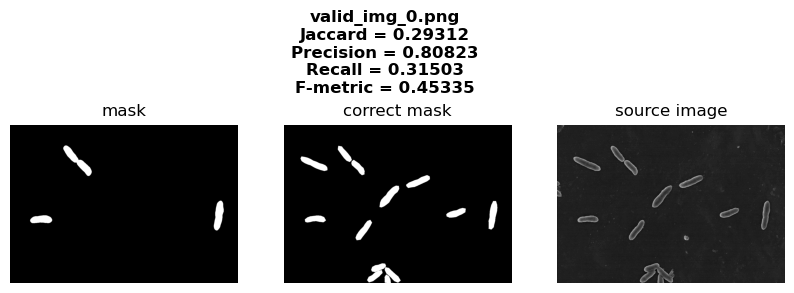

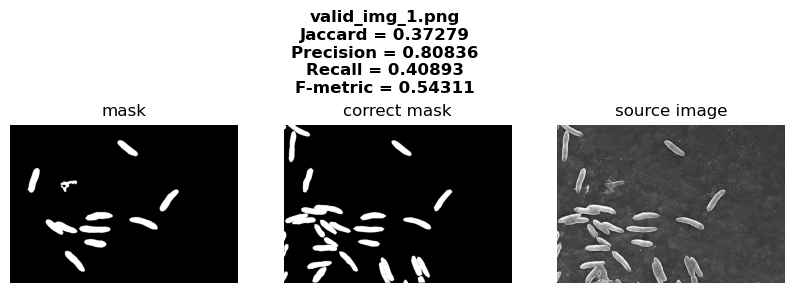

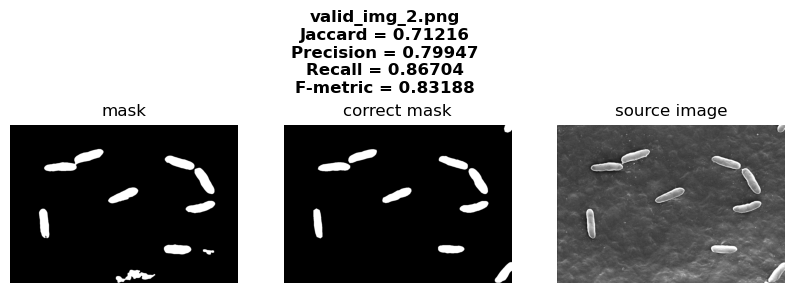

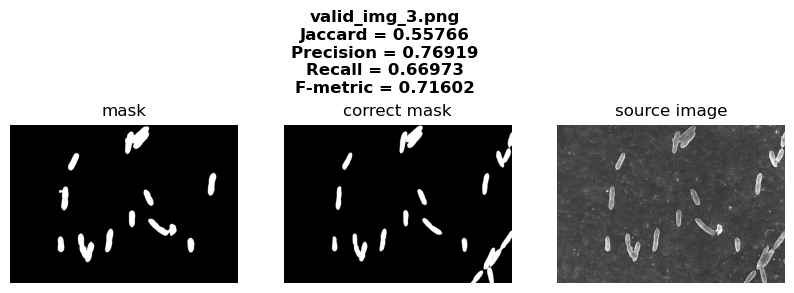

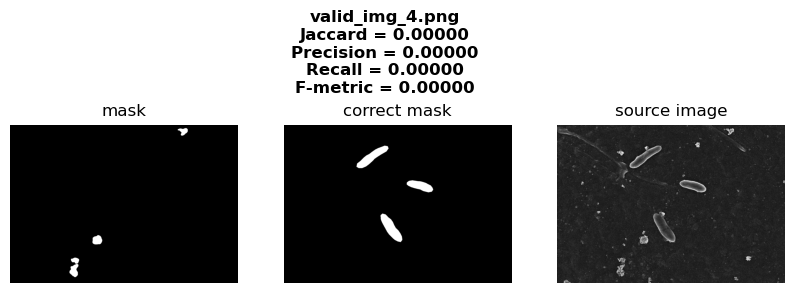

...

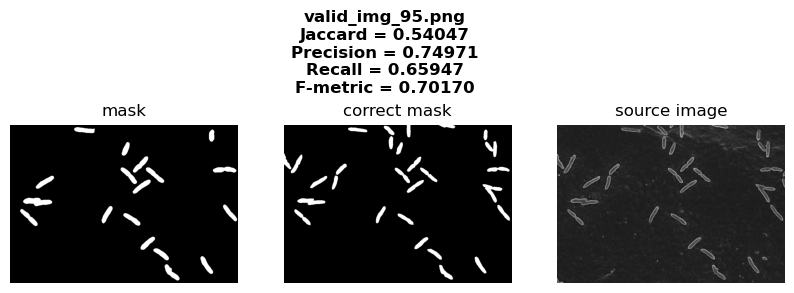

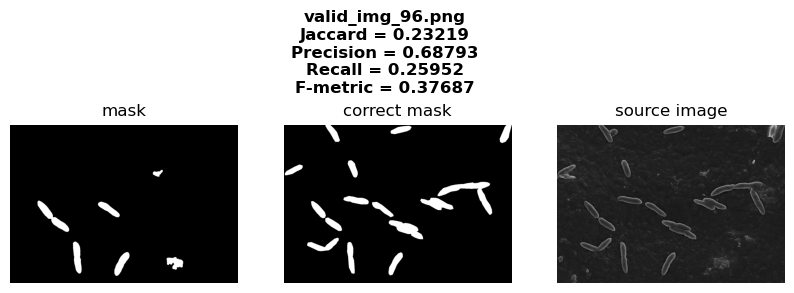

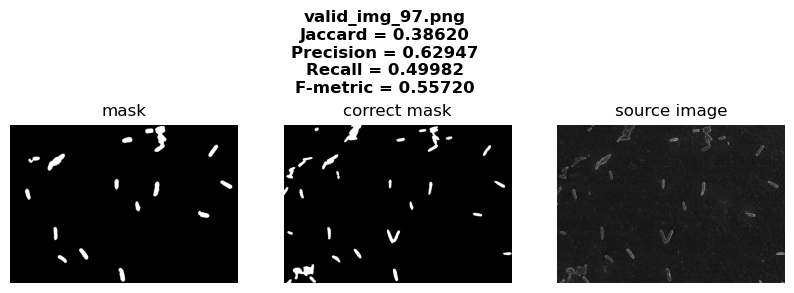

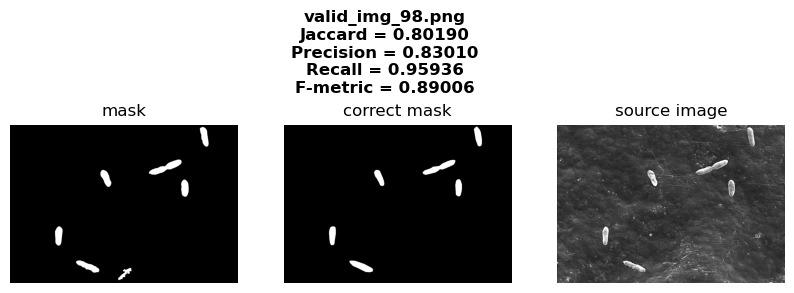

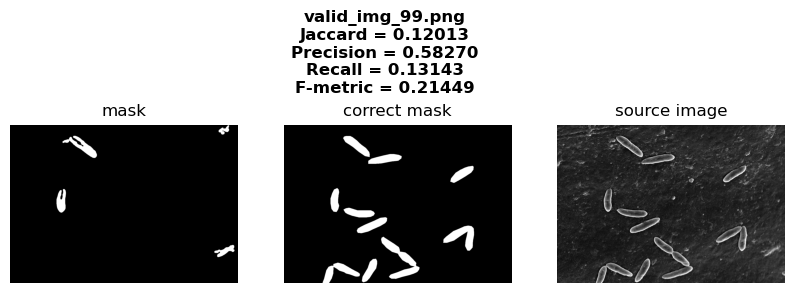

In [49]:
output = script(path_to_masks, path_to_correct_masks, path_to_images, image_name_pattern)
mean_jaccard, mean_precision, mean_recall, mean_f = output[:4]
list_jaccard, list_precision, list_recall, list_f = output[4:]

In [50]:
print('Среднее значение Jaccard:', mean_jaccard)
print('Среднее значение Precision:', mean_precision)
print('Среднее значение Recall:', mean_recall)
print('Среднее значение F-metric:', mean_f)

Среднее значение Jaccard: 0.4749323510814697
Среднее значение Precision: 0.7074941818203113
Среднее значение Recall: 0.5997024464305502
Среднее значение F-metric: 0.6185229515879758


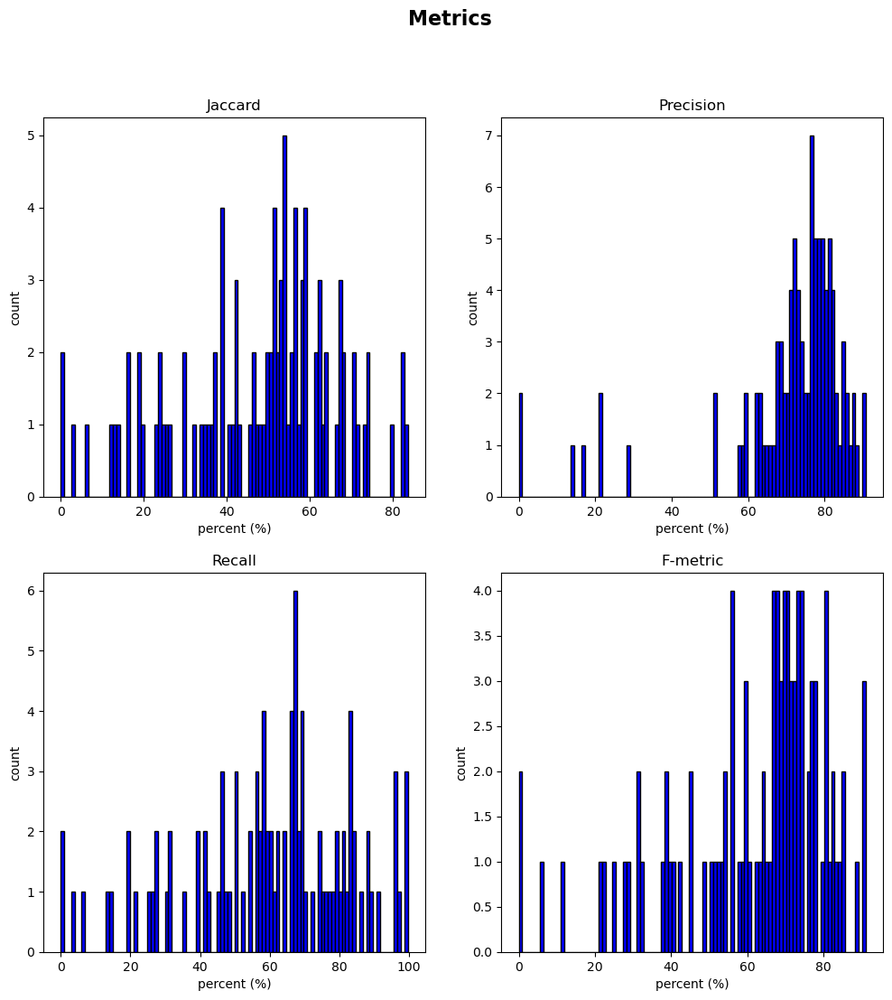

In [51]:
new_list_jaccard = [i * 100 for i in list_jaccard]
new_list_precision = [i * 100 for i in list_precision]
new_list_recall = [i * 100 for i in list_recall]
new_list_f = [i * 100 for i in list_f]

fig, axs = plt.subplots(2, 2)
fig.suptitle('Metrics', fontsize=16, fontweight='bold')
fig.set_size_inches((12, 12))

axs[0, 0].hist(new_list_jaccard, color = 'blue', edgecolor = 'black', bins = int(100))
axs[0, 0].set_title('Jaccard')
axs[0, 0].set_xlabel('percent (%)')
axs[0, 0].set_ylabel('count')

axs[0, 1].hist(new_list_precision, color = 'blue', edgecolor = 'black', bins = int(100))
axs[0, 1].set_title('Precision')
axs[0, 1].set_xlabel('percent (%)')
axs[0, 1].set_ylabel('count')

axs[1, 0].hist(new_list_recall, color = 'blue', edgecolor = 'black', bins = int(100))
axs[1, 0].set_title('Recall')
axs[1, 0].set_xlabel('percent (%)')
axs[1, 0].set_ylabel('count')

axs[1, 1].hist(new_list_f, color = 'blue', edgecolor = 'black', bins = int(100))
axs[1, 1].set_title('F-metric')
axs[1, 1].set_xlabel('percent (%)')
axs[1, 1].set_ylabel('count')

plt.show()